# Grouping for Synthesis AI face dataset

At first, we install `face_api_dataset` other dependencies and download test datasets.

In [1]:
%%bash
curl -o "setup.sh" https://raw.githubusercontent.com/Synthesis-AI-Dev/face_api_dataset_examples/main/setup.sh
chmod a+x setup.sh
./setup.sh

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1281  100  1281    0     0   2666      0 --:--:-- --:--:-- --:--:--  2725
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0

Process is interrupted.


Now we add some imports for the visualisation.

In [2]:
%matplotlib inline

In [3]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

We use `FaceApiDataset` class to access synthesis datasets.

In [4]:
from face_api_dataset import FaceApiDataset, Modality, Grouping

We have different options for groupping the dataset items. `grouping=Grouping.None` was set be default in previous examples so we will showcase more advanced cases.

If `grouping=Grouping.None` is set, then each image is treated independently.
The size of the dataset is **#scenes** * **#cameras** * **#frames**.

In [5]:
data_root = "test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.NONE)

len(dataset)

660

For each item you can acess scene id, camera name and frame number.

In [6]:
item = dataset[24]
print("Scene ID ", item[Modality.SCENE_ID])
print("Camera name ", item[Modality.CAMERA_NAME])
print("Frame number ", item[Modality.FRAME_NUM])

Scene ID  10
Camera name  away
Frame number  11


In [7]:
def show_items(items):
    fig = plt.figure(figsize=(20, 20))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(3, 3),
                     axes_pad=0.3,
                     )

    for ax, frame in zip(grid, items):
        ax.imshow(frame[Modality.RGB])
        title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.SCENE_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
        ax.set_title(title)
    plt.show()

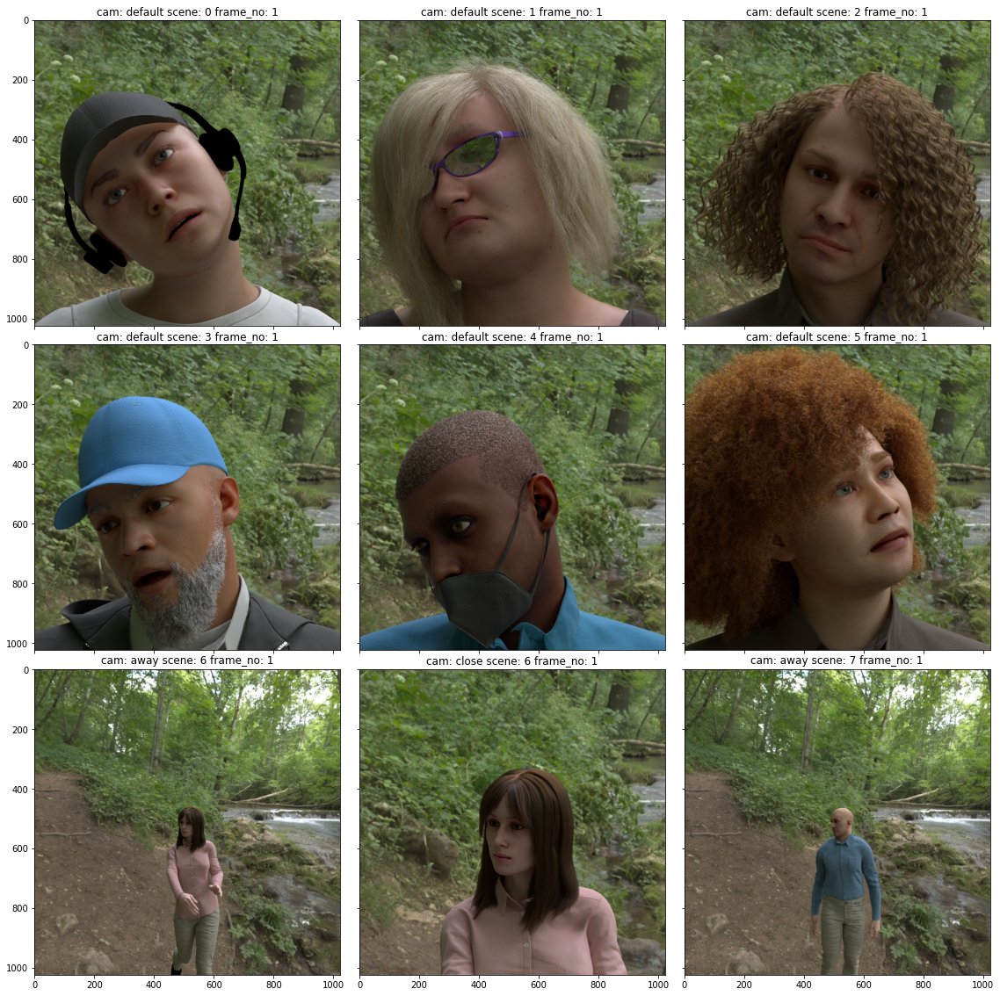

In [8]:
show_items(dataset)

If `grouping=Grouping.CAMERA` is set, then all items with the same camera are grouped into the list.

The size of the dataset is **#cameras**.

In [9]:
dataset = FaceApiDataset(data_root, grouping=Grouping.CAMERA)

len(dataset)

3

In [10]:
group = dataset[1]
len(group)

327

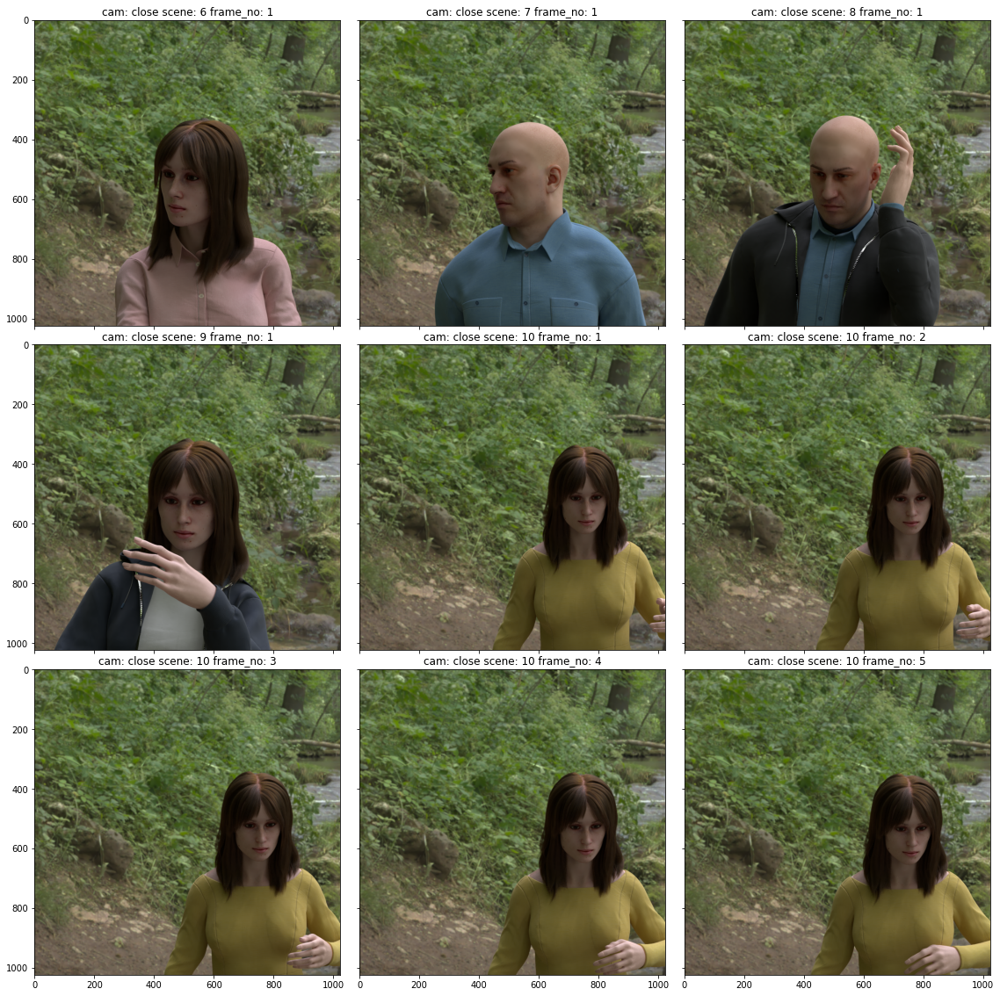

In [11]:
show_items(group)

If `grouping=Grouping.SCENE` is set, then all items with the same scene are grouped into the list.

The size of the dataset is **#scenes** , each element `List[Item]` is is a list of frames from all cameras from the same scene.

In [12]:
dataset = FaceApiDataset(data_root, grouping=Grouping.SCENE)

len(dataset)

13

In [13]:
group = dataset[10]

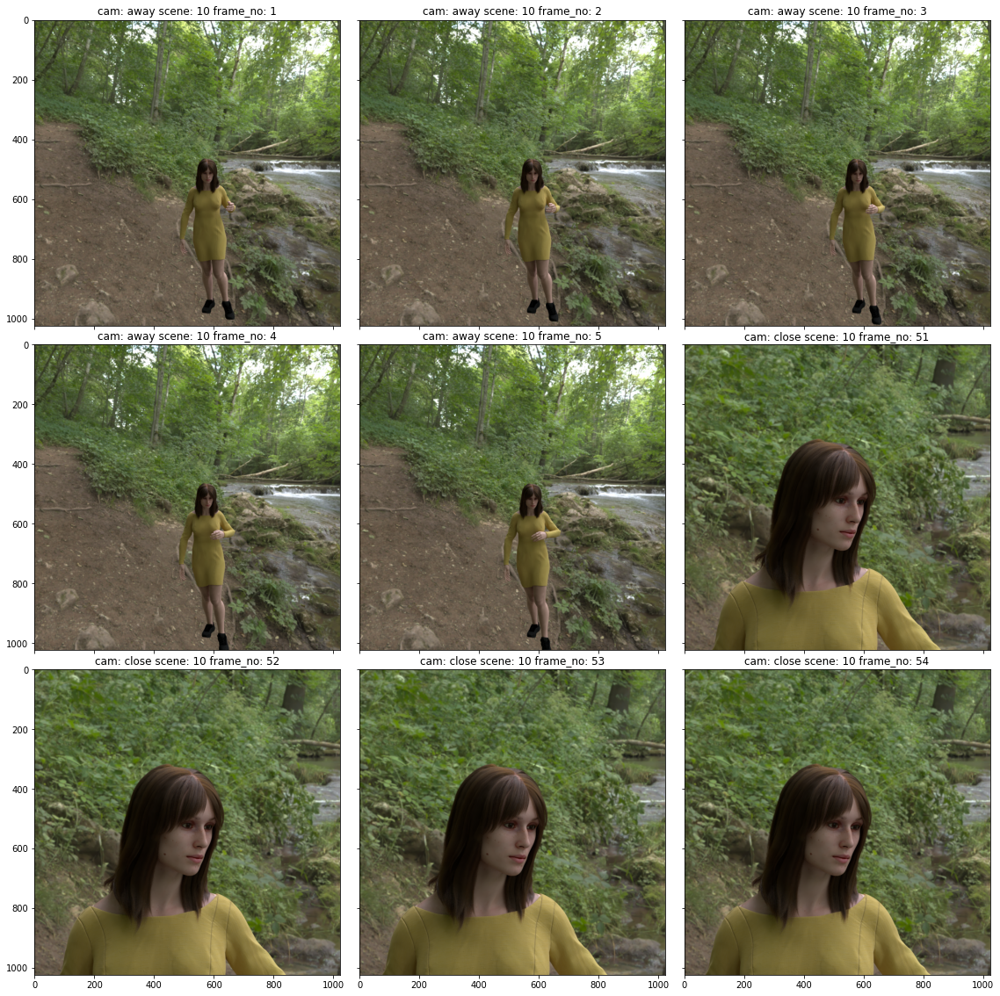

In [14]:
show_items(group[:5] + group[-5:])

If `grouping=Grouping.SCENE_CAMERA` is set, then all items are grouped first by camera and then by scene.

The size of the dataset is **#scenes** * **#cameras** , each element is a `List[Item]` is a list of consecutive frames for given scene and camera.

In [15]:
dataset = FaceApiDataset(data_root, grouping=Grouping.SCENE_CAMERA)

len(dataset)

20

In [16]:
group = dataset[15]

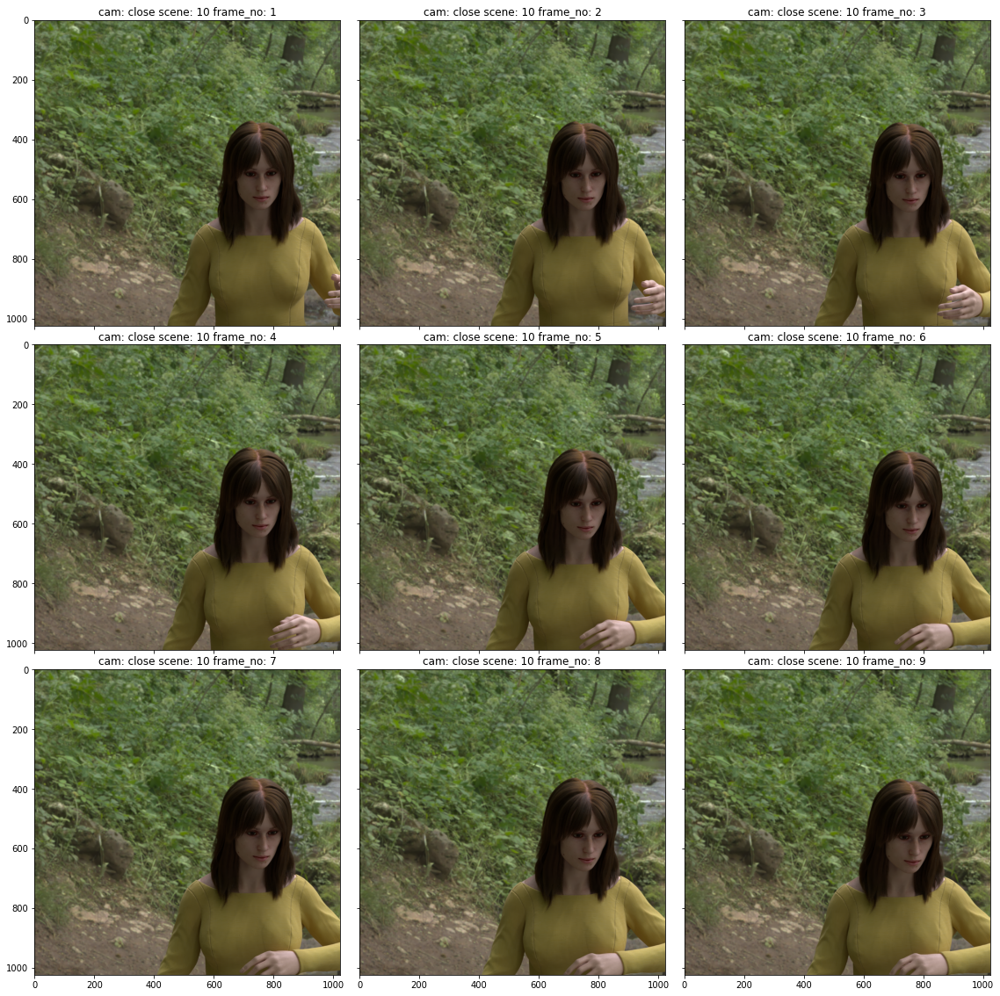

In [17]:
show_items(group)

In case you want to access your dataset items in a particular order, you can have direct access to grouping index calling `FaceApiDataset.get_group_index`

In [18]:
group_index = dataset.get_group_index()
group_index.head()

,SCENE_ID,CAMERA_NAME
0,0,default
1,1,default
2,2,default
3,3,default
4,4,default


Let's get all groups with `render_id == 10`

In [19]:
query = group_index.query('SCENE_ID == 10')
query

,SCENE_ID,CAMERA_NAME
14,10,away
15,10,close


Index  14


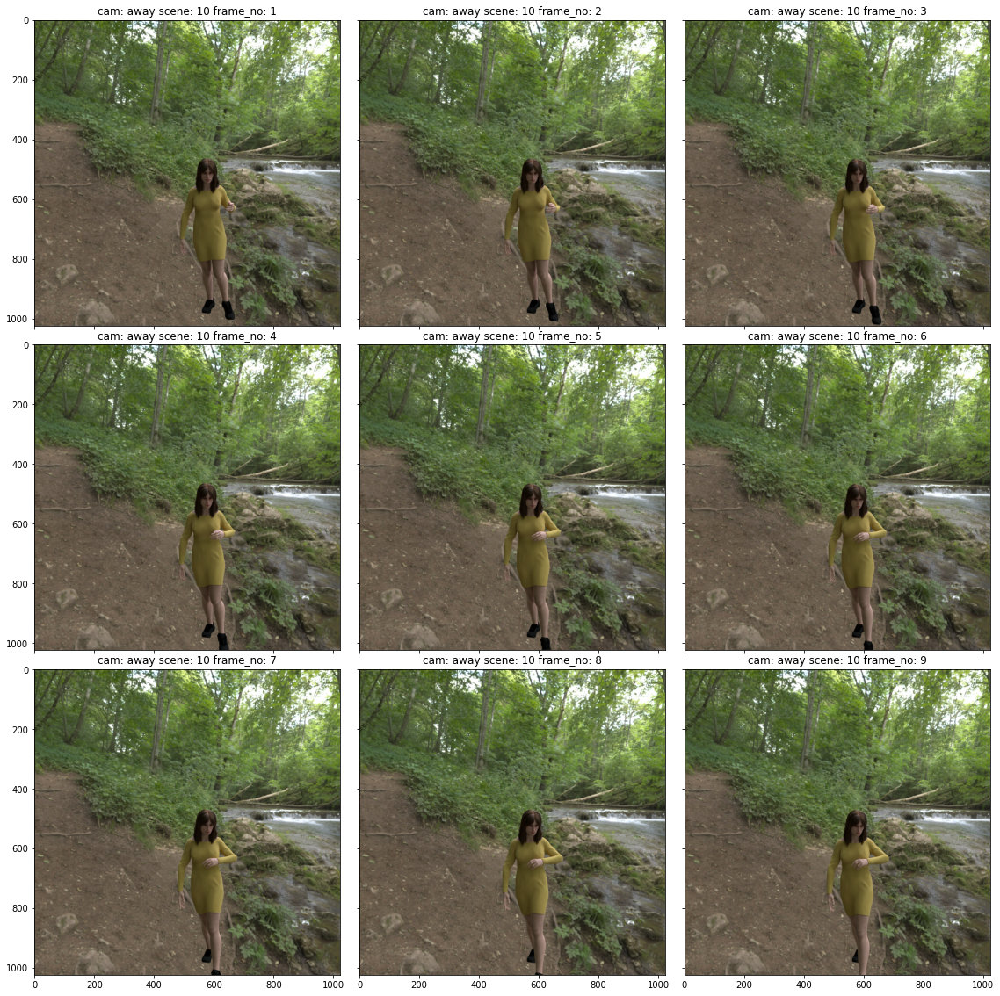

Index  15


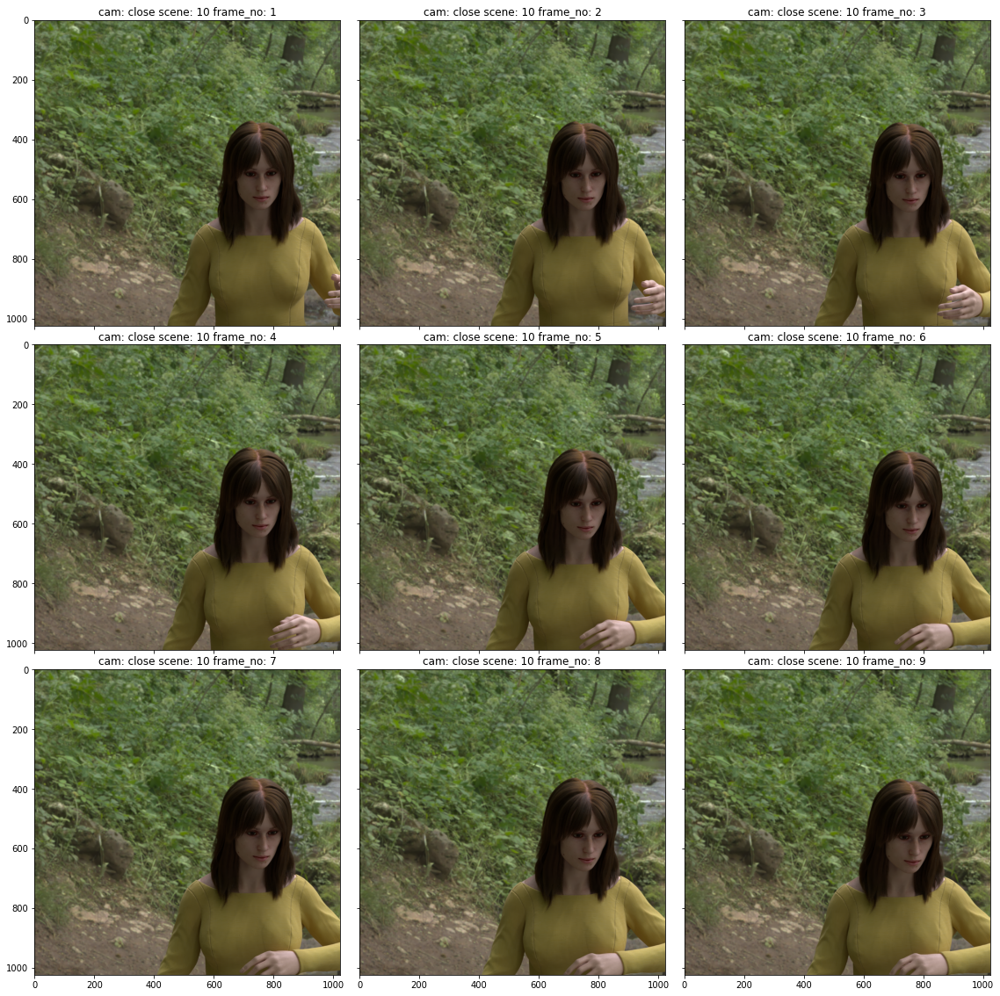

In [20]:
for idx in query.index:
    print("Index ", idx)
    group = dataset[idx]
    show_items(group)